In [72]:
import hydra
from hydra import initialize, compose
import numpy as np
import torch
from PIL import ImageFont

from zennit.composites import EpsilonPlusFlat
from zennit.torchvision import ResNetCanonizer

from zennit.image import imgify
from zennit.torchvision import ResNetCanonizer


from crp.attribution import CondAttribution
from crp.concepts import ChannelConcept
from crp.image import imgify

from crp.helper import get_layer_names

In [73]:
N_EXAMPLES = 8
BATCH_SIZE = 1  # do not change!
FNT = ImageFont.truetype("DejaVuSansMono.ttf", 17)
PATH = "/home/alicja/studia/xai_crp_lrp/good_model.ckpt"

In [74]:
with initialize(version_base=None, config_path="../conf"):
    config = compose(config_name="main")
    config.datamodule.batch_size = BATCH_SIZE

    data_module = hydra.utils.instantiate(config.datamodule)
    dl = data_module.xai_dataloader()

    model = hydra.utils.instantiate(config.module.model)

In [75]:
model.load_state_dict({k[4:]: v for k, v in torch.load(PATH, map_location=torch.device("cpu"))["state_dict"].items() if k[:4] == "net."})
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [76]:
cc = ChannelConcept()
composite = EpsilonPlusFlat([ResNetCanonizer()])
attribution = CondAttribution(model)

In [77]:
layer_names = get_layer_names(model, [torch.nn.Conv2d, torch.nn.Linear])
mask_map = {name: cc.mask for name in layer_names}

conditions = [{list(mask_map.items())[40][0]: [35], "y": [1]}]

positive_samples = []
negative_samples = []

for i, (x, y) in enumerate(dl):
    if len(positive_samples) == 10 and len(negative_samples) == 10:
        break

    if y[0].item() == 0.0 and len(negative_samples) < 10:
        negative_samples.append((x, y))
    elif len(positive_samples) < 10:
        positive_samples.append((x, y))


Kryteria budzenia niepokoju:
- Asymetria - kształt nie jest okrągły
- Nierówne, postrzępione brzegi
- Kolor - rożne zabarwienia w obrębie jednego znamienia
- Rozmiar - powyżej 6mm, kinda impossible to figure out unless hair for scale

Czynniki ryzyka:
- jasna karnacja - więc sensownie, że patrzy na skórę
- wiek starczy - skóra + włosy pewnie
- płeć męska - włosy?
- choroby współistniejące, obciążenia genetyczne, osłabiony stan immunologiczny - raczej nie da się zobaczyć
- liczne piegi/znamiona - no można na to patrzeć

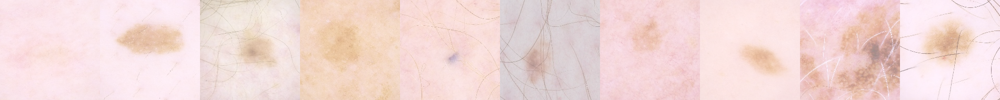

Layer 0


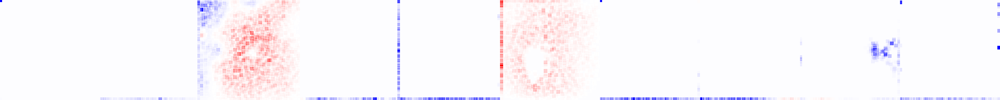

Layer 1


/home/alicja/anaconda3/envs/py10/lib/python3.10/site-packages/zennit/image.py:187: RuntimeWarning: invalid value encountered in true_divide
  array = (array - vmin) / (vmax - vmin)


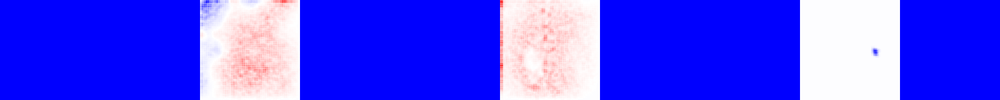

Layer 2


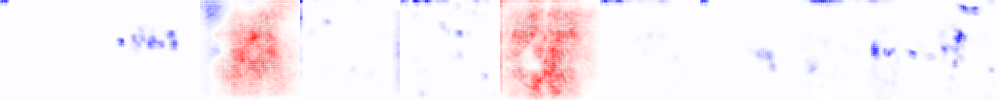

Layer 3


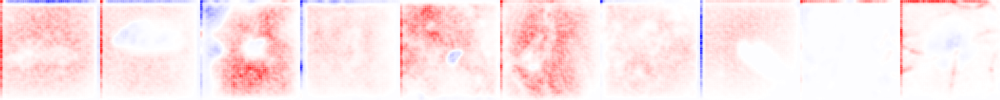

Layer 4


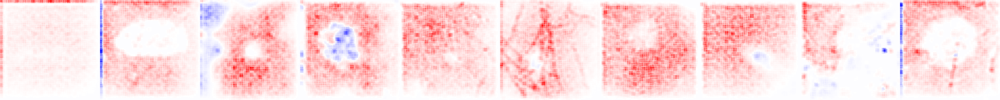

Layer 5


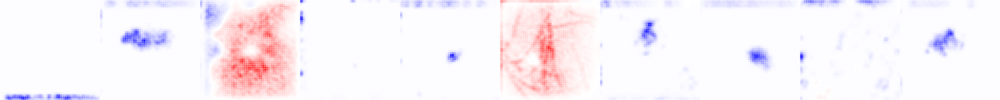

Layer 6


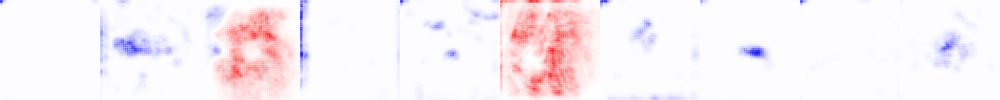

Layer 7


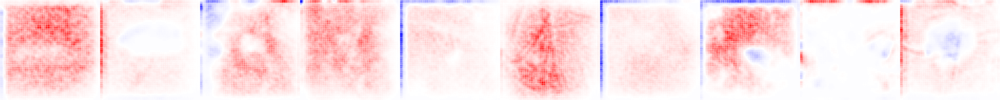

Layer 8


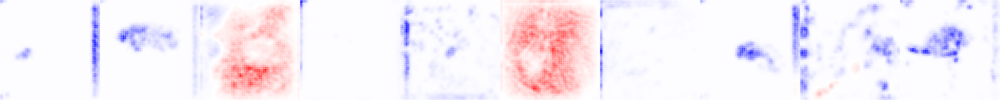

Layer 9


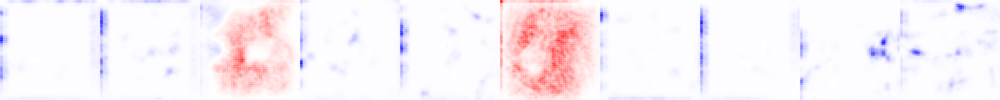

Layer 10


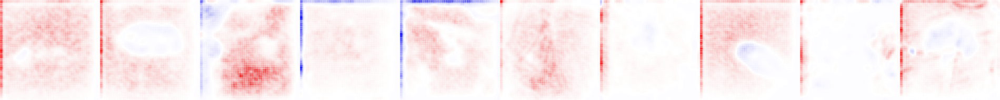

Layer 11


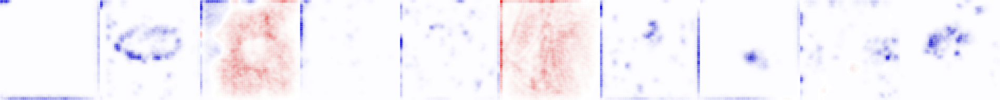

Layer 12


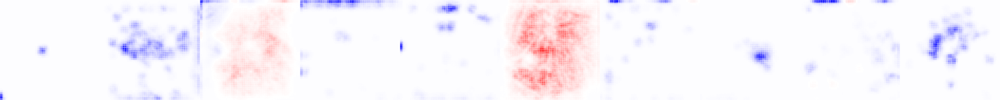

Layer 13


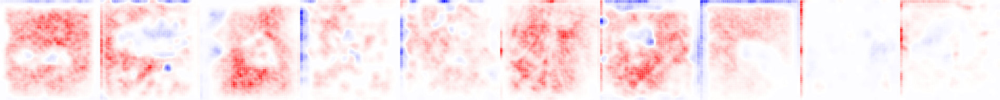

Layer 14


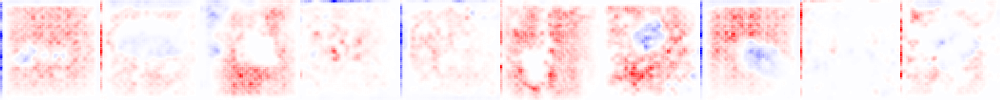

Layer 15


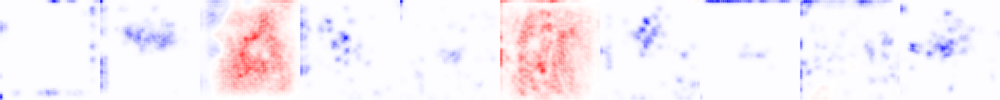

Layer 16


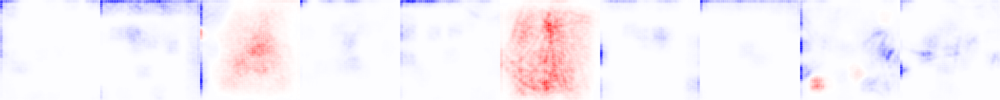

Layer 17


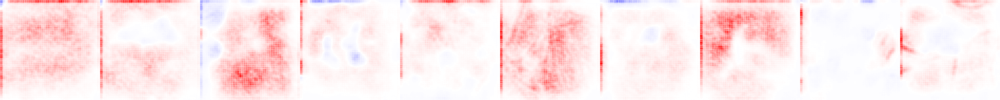

Layer 18


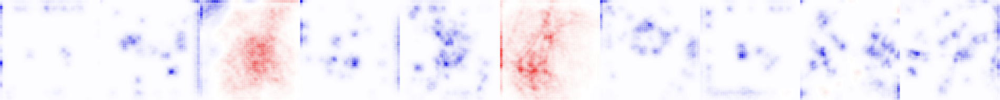

Layer 19


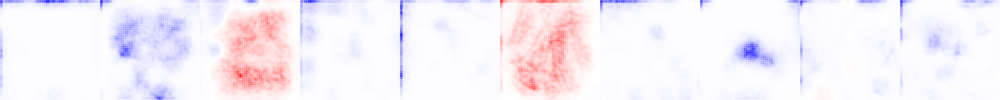

Layer 20


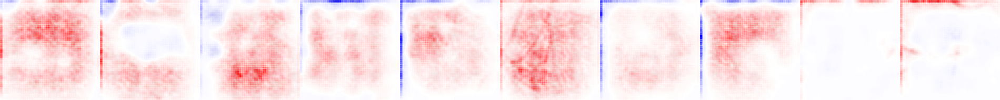

Layer 21


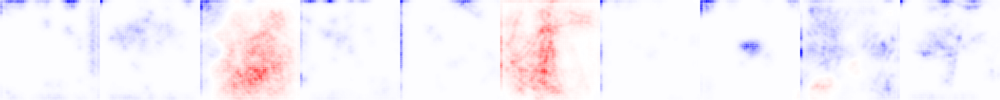

Layer 22


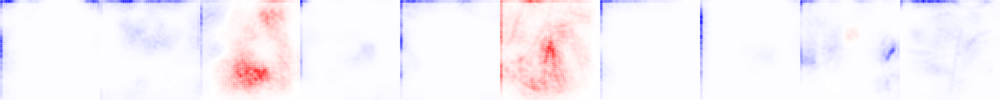

Layer 23


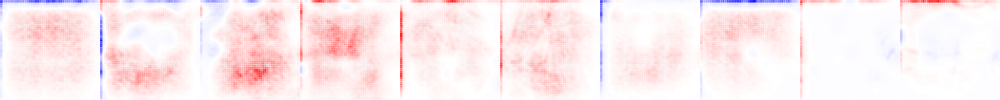

Layer 24


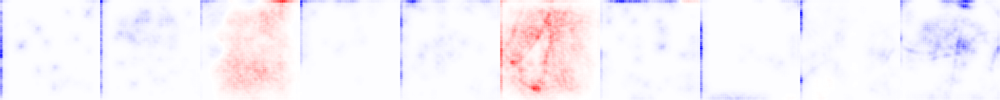

Layer 25


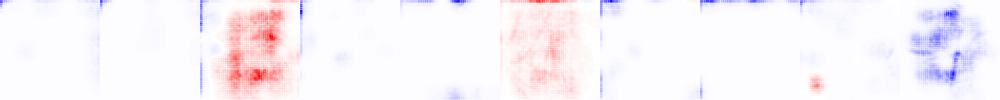

Layer 26


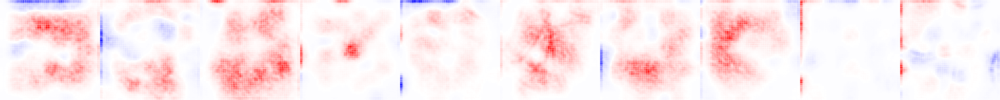

Layer 27


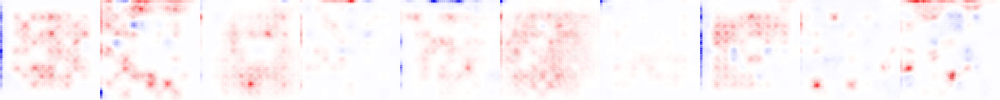

Layer 28


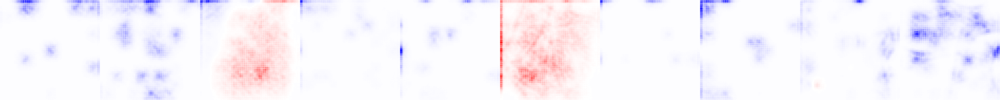

Layer 29


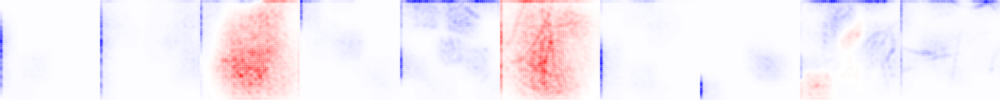

Layer 30


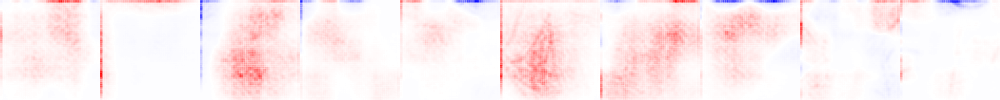

Layer 31


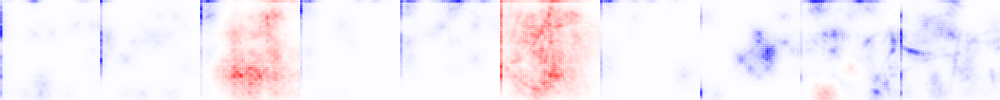

Layer 32


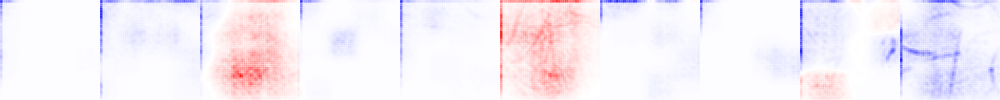

Layer 33


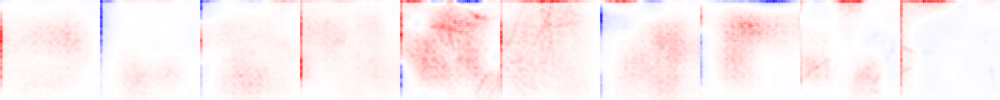

Layer 34


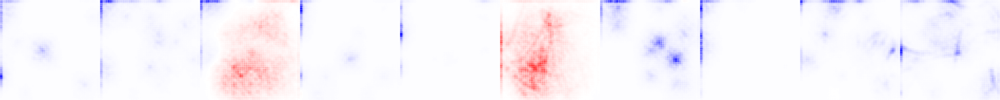

Layer 35


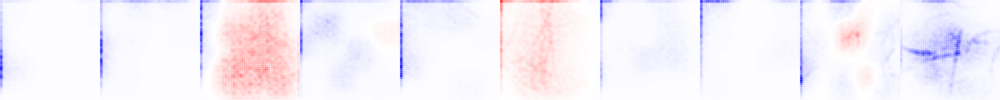

Layer 36


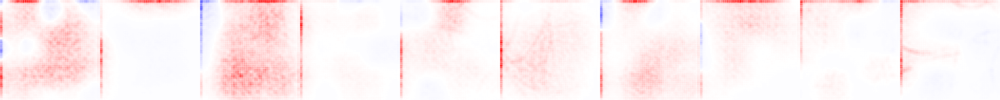

Layer 37


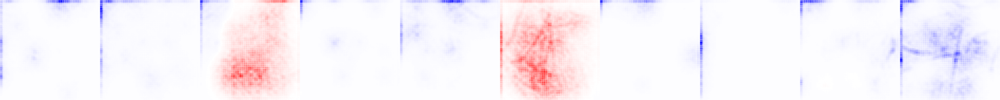

Layer 38


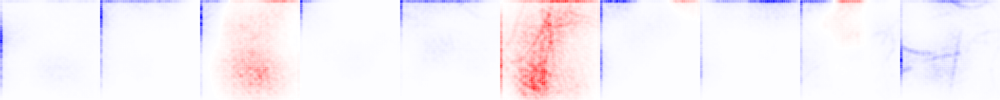

Layer 39


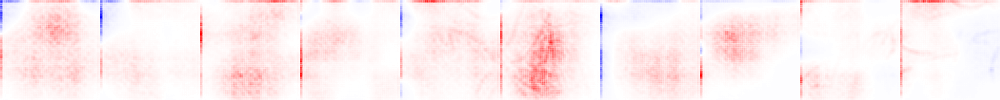

Layer 40


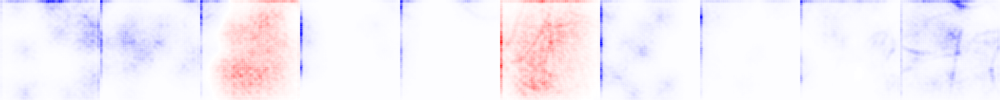

Layer 41


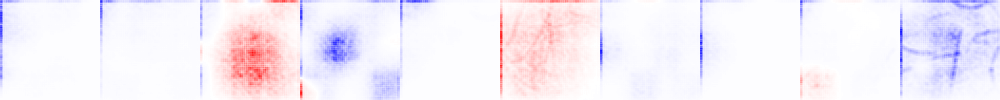

Layer 42


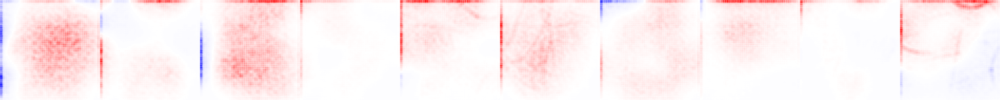

Layer 43


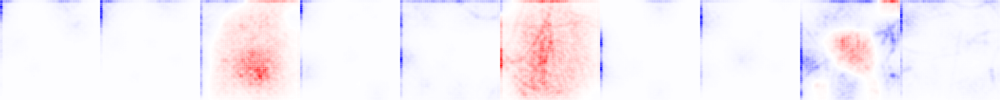

Layer 44


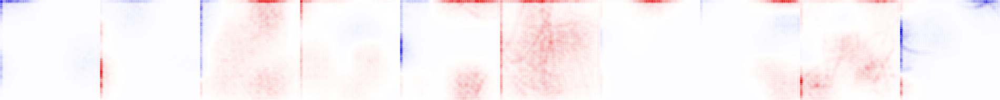

Layer 45


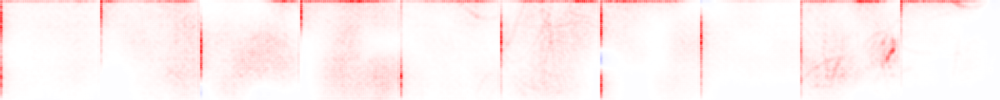

Layer 46


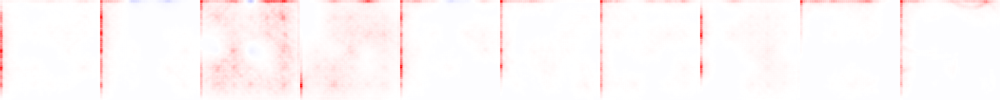

Layer 47


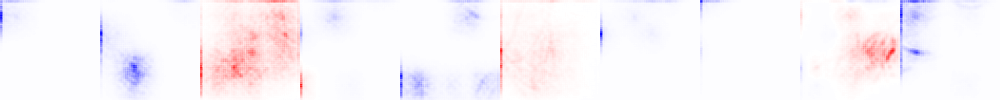

Layer 48


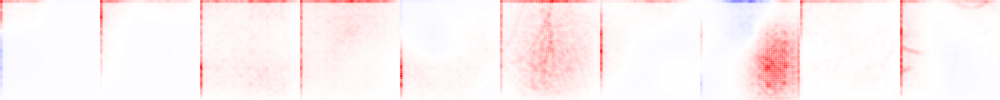

Layer 49


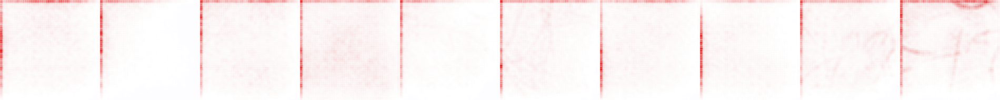

Layer 50


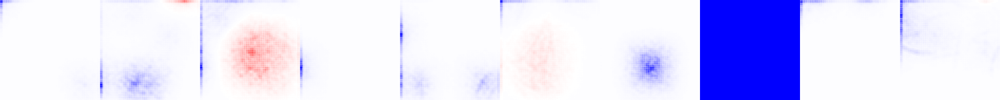

Layer 51


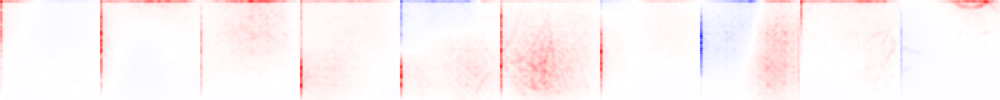

Layer 52


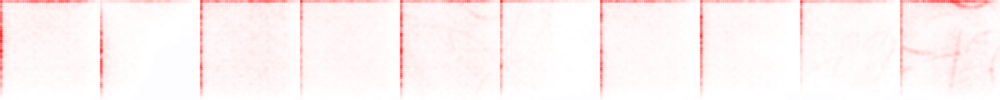

Layer 53


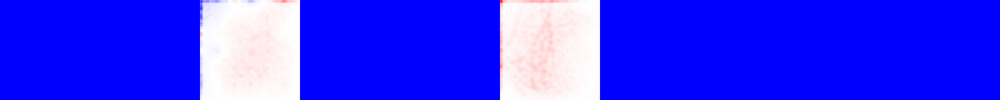

In [78]:
display(imgify(torch.concat([sample[0] for sample in positive_samples]), symmetric=True, grid=(1, len(positive_samples))))
conditions = [{'y': [1]}]

for i in range(len(mask_map)):
    print("Layer", i)

    heatmaps = []

    for sample in positive_samples:
        sample[0].requires_grad = True
        attr = attribution(sample[0], conditions, composite, record_layer=layer_names)

        rel_c = cc.attribute(attr.relevances[list(mask_map.items())[i][0]], abs_norm=True)
        concept_ids = torch.argsort(rel_c[0], descending=True)[0] # All look the same anyway

        conditions_1 = [{list(mask_map.items())[i][0]: [concept_ids], 'y': [1]}]
        conditions_2 = [{list(mask_map.items())[i][0]: [], 'y': [1]}]

        heatmap_1, _, _, _ = attribution(sample[0], conditions_1, composite)
        heatmap_2, _, _, _ = attribution(sample[0], conditions_2, composite)

        heatmaps.append(heatmap_1 - heatmap_2)

    heatmaps = torch.concat(heatmaps)

    display(imgify(heatmaps, symmetric=True, grid=(1, len(positive_samples))))



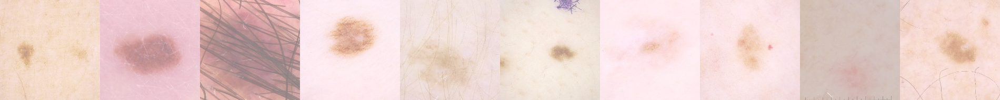

Layer 0


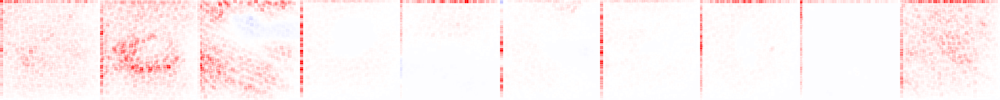

Layer 1


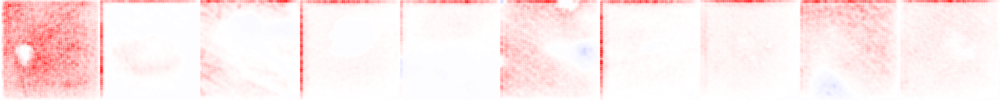

Layer 2


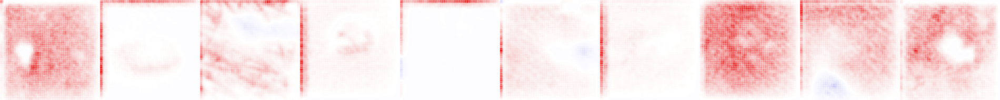

Layer 3


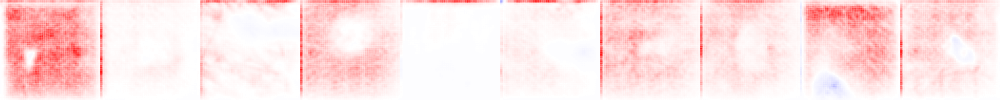

Layer 4


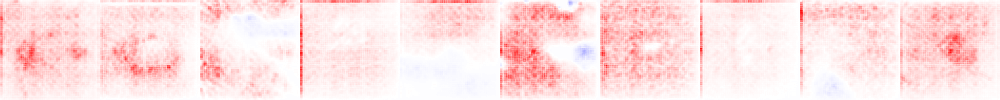

Layer 5


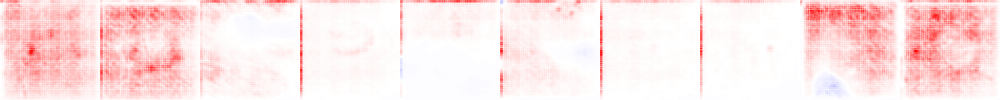

Layer 6


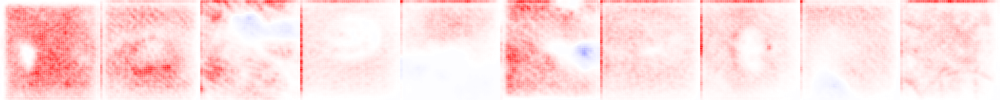

Layer 7


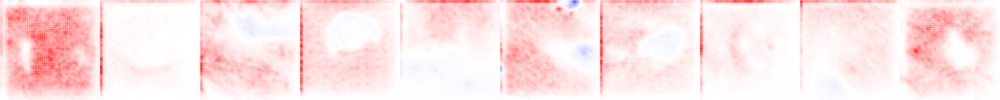

Layer 8


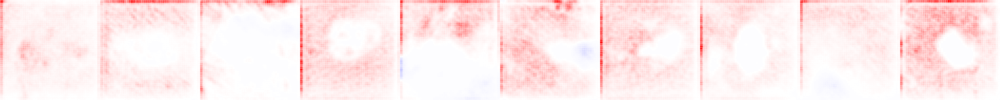

Layer 9


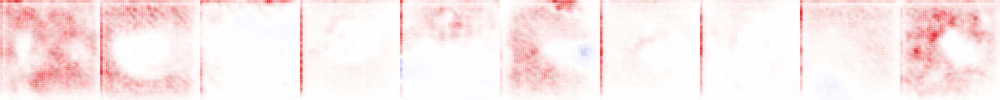

Layer 10


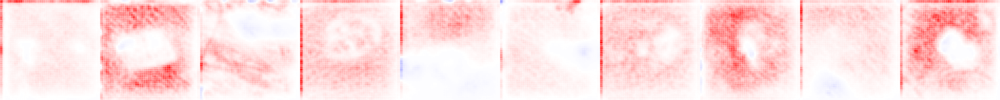

Layer 11


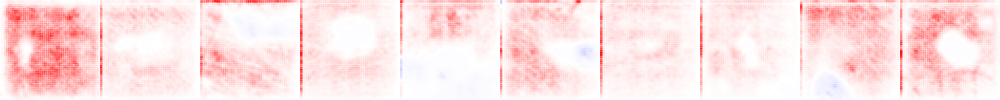

Layer 12


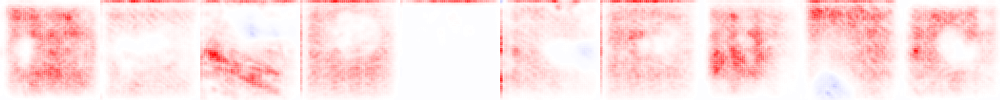

Layer 13


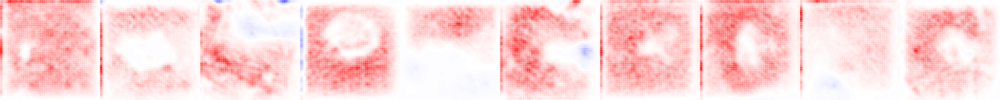

Layer 14


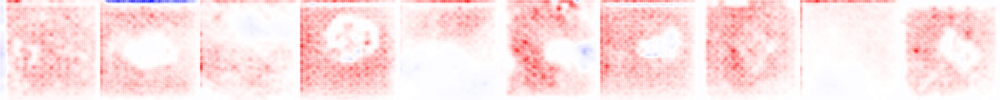

Layer 15


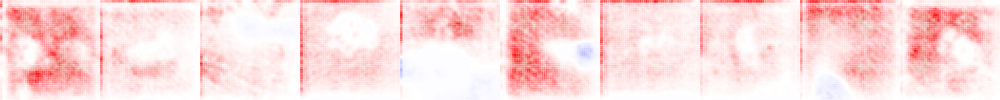

Layer 16


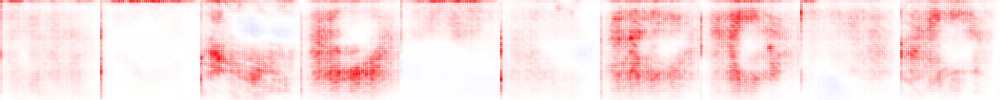

Layer 17


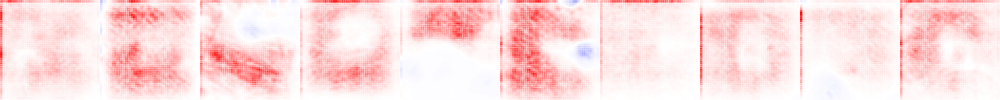

Layer 18


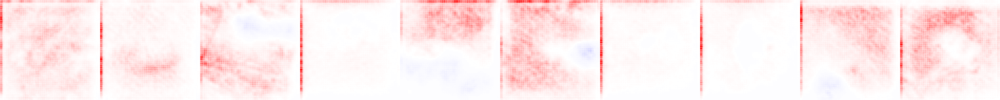

Layer 19


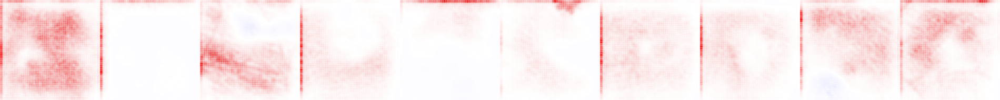

Layer 20


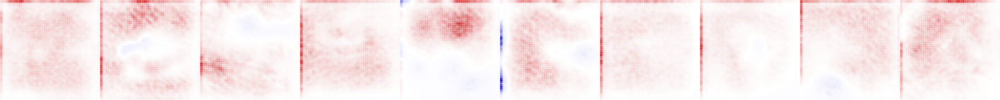

Layer 21


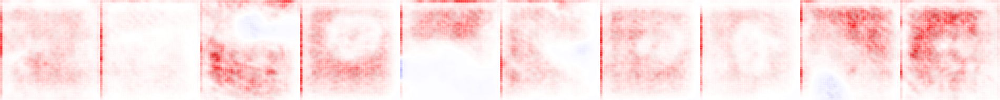

Layer 22


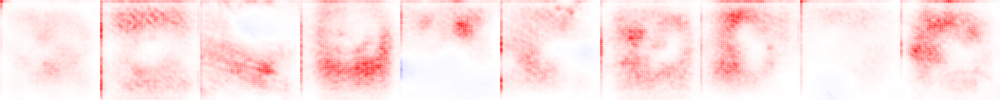

Layer 23


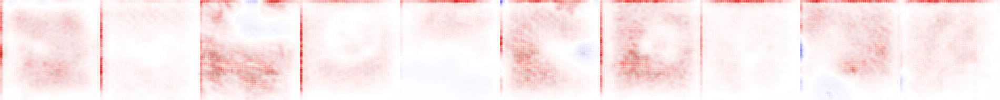

Layer 24


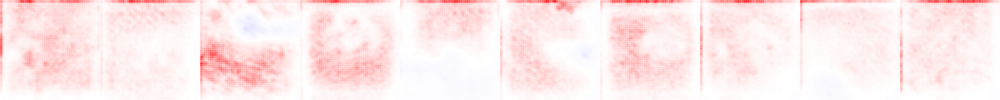

Layer 25


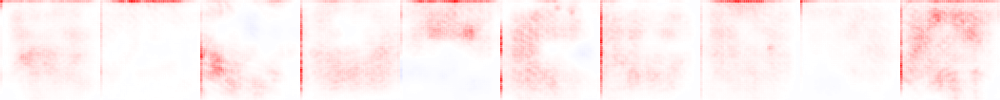

Layer 26


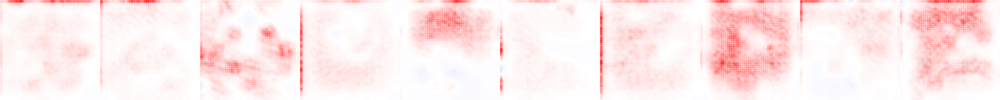

Layer 27


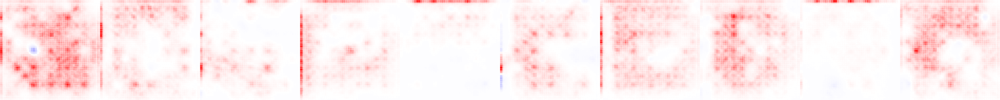

Layer 28


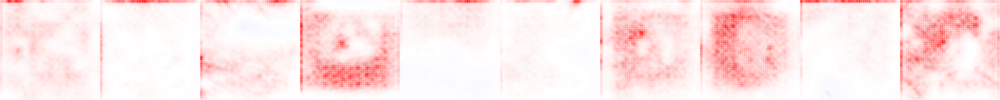

Layer 29


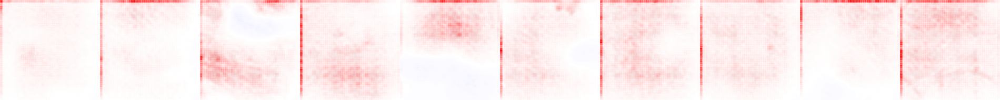

Layer 30


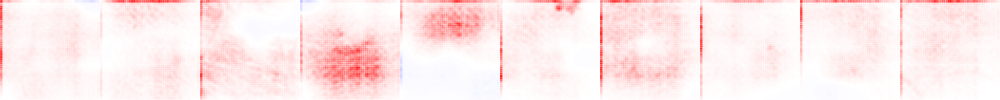

Layer 31


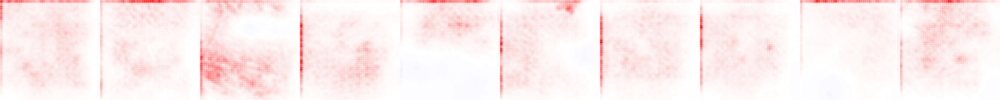

Layer 32


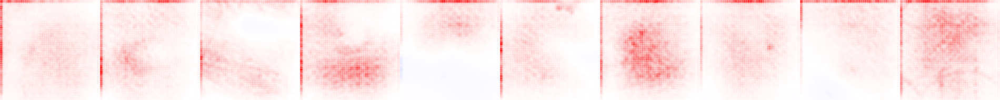

Layer 33


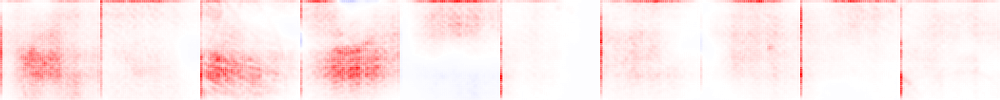

Layer 34


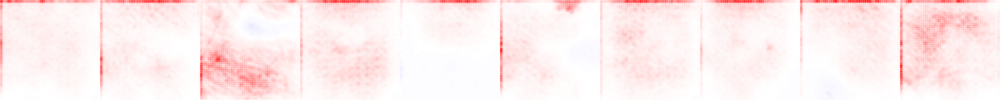

Layer 35


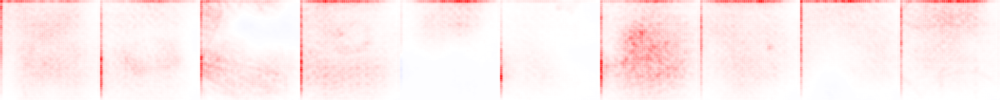

Layer 36


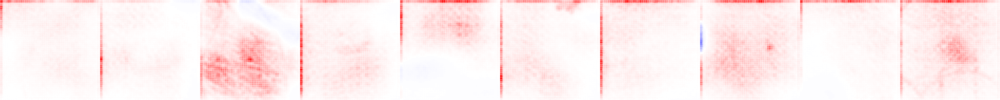

Layer 37


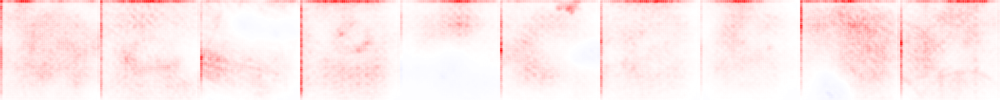

Layer 38


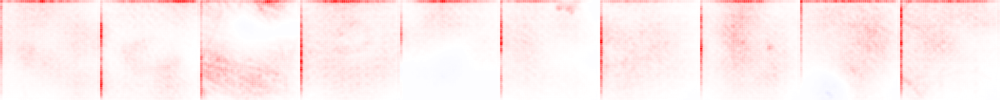

Layer 39


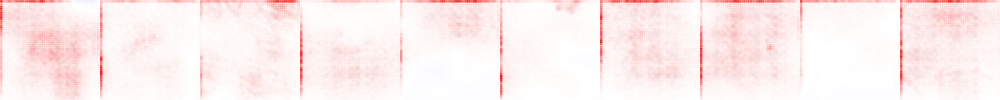

Layer 40


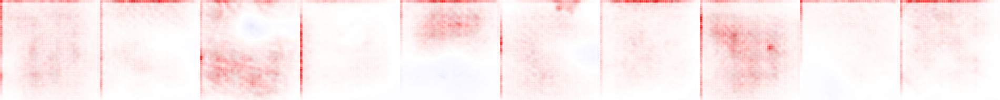

Layer 41


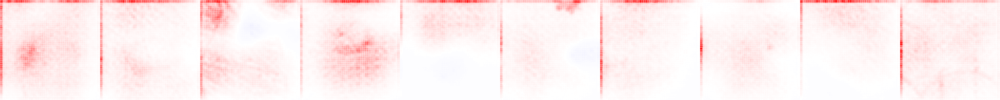

Layer 42


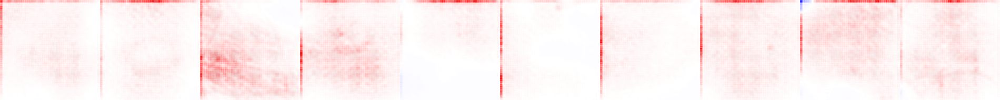

Layer 43


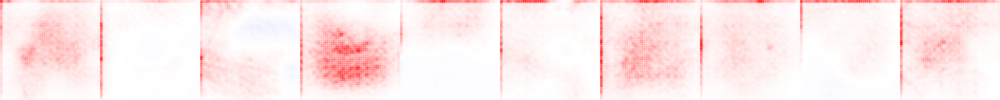

Layer 44


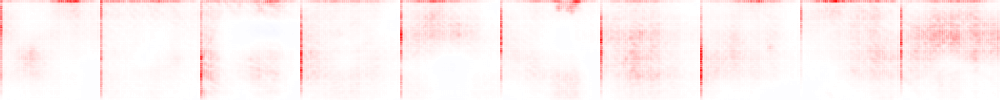

Layer 45


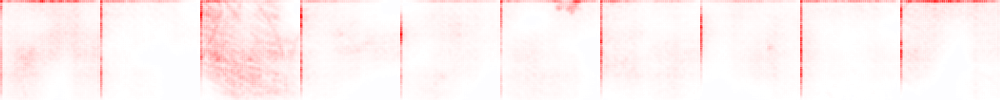

Layer 46


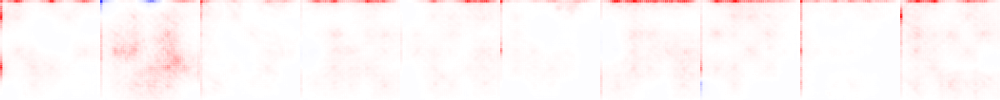

Layer 47


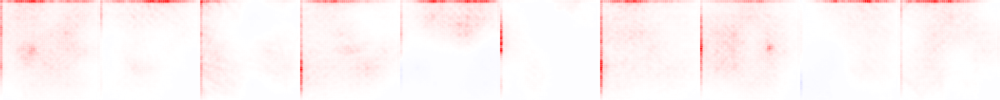

Layer 48


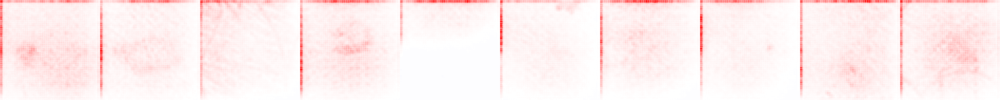

Layer 49


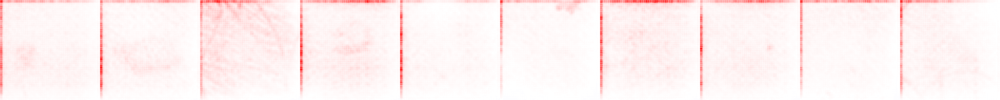

Layer 50


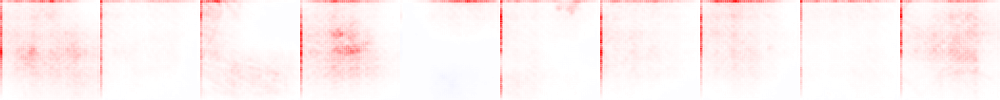

Layer 51


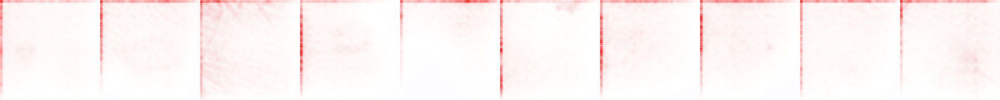

Layer 52


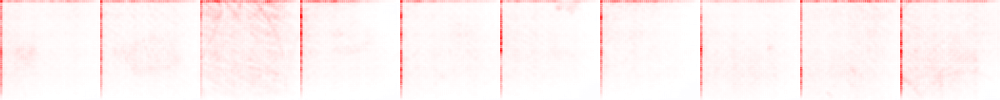

Layer 53


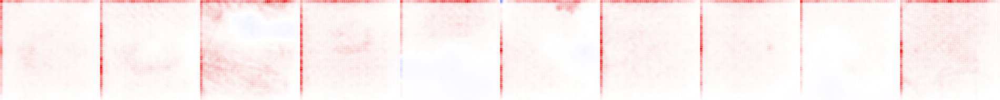

In [79]:
display(imgify(torch.concat([sample[0] for sample in negative_samples]), symmetric=True, grid=(1, len(negative_samples))))
conditions = [{'y': [0]}]

for i in range(len(mask_map)):
    print("Layer", i)

    heatmaps = []

    for sample in negative_samples:
        sample[0].requires_grad = True
        attr = attribution(sample[0], conditions, composite, record_layer=layer_names)

        rel_c = cc.attribute(attr.relevances[list(mask_map.items())[i][0]], abs_norm=True)
        concept_ids = torch.argsort(rel_c[0], descending=True)[0] # All look the same anyway

        conditions_1 = [{list(mask_map.items())[i][0]: [concept_ids], 'y': [0]}]
        conditions_2 = [{list(mask_map.items())[i][0]: [], 'y': [0]}]

        heatmap_1, _, _, _ = attribution(sample[0], conditions_1, composite)
        heatmap_2, _, _, _ = attribution(sample[0], conditions_2, composite)

        heatmaps.append(heatmap_1 - heatmap_2)

    heatmaps = torch.concat(heatmaps)

    display(imgify(heatmaps, symmetric=True, grid=(1, len(negative_samples))))

